In [187]:
import pandas as pd
import numpy  as np
import random
import yaml
import os
import json 
import pickle
from matplotlib import pyplot as plt
from modules.util import batch_image_rotation, batch_kp_rotation 
import seaborn as sns
from modules.util import kp2gaussian2, gaussian2kp
from modules.losses import l2_loss, l1_loss  


# Model Leaderboard
given a folder where the model are stored scrape the result files and createa a dataframe

In [362]:
def get_files(path, split_char="/"):
    listOfFiles = list()
    for (dirpath, dirnames, filenames) in os.walk(path):
        for file in filenames:
            #extract metrics from the file
            if file == "evaluation.json":
                listOfFiles += [{'path':os.path.join(dirpath)}]
    return listOfFiles

In [363]:
if os.name == 'nt':
    split_char = "\\"
else:
    split_char = "/"
    
pred_dir = "/home/rfranceschini/usc2dk/models/h36m_mpii/"
file_to_compare = get_files(pred_dir, split_char=split_char)

In [364]:
gan_models = []
source_models = []
for fold in file_to_compare:
    print(fold["path"])
    config_file =os.path.join(fold["path"], "u2dkp.yaml")
    metrics = json.load(open(os.path.join(fold["path"], "evaluation.json"), "r"))
    try:
        with open(config_file) as f:
            dataMap = yaml.load(f)   
        dataMap["train_params"]["MSE"] = metrics["MSE"]
        dataMap["train_params"]["PCK"] = metrics["PCK"]
        dataMap["train_params"]["path"] = fold["path"]
        dataMap["train_params"]["geometric"] = dataMap["train_params"]["loss_weights"]["geometric"] 
        
        gan_models.append(dataMap["train_params"])

    except:
        config_file =os.path.join(fold["path"], "u2dkp_source.yaml")
        with open(config_file) as f:
            dataMap = yaml.load(f)
        dataMap["train_params"]["MSE"] = metrics["MSE"]
        dataMap["train_params"]["PCK"] = metrics["PCK"]
        source_models.append(dataMap["train_params"])
        

/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 13-11-20 16:32:37
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 13-11-20 08:34:12
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 11:54:42
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 20:05:29
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 09:41:43
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 07:40:28
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 09:11:10
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 13-11-20 15:55:47

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/ipykernel_launcher.py:9: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  if __name__ == '__main__':



/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 12:51:05
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp_geo 12-11-20 12:36:57
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp_no_geo 12-11-20 08:23:00
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 13:05:27
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 13:09:34
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp_no_geo_unroll_5 12-11-20 10:17:11
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 12-11-20 13:50:22
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 09:10:39
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 17:35:55
/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 12-11-20 18:30:12


In [365]:
gan_perf_df = pd.DataFrame().from_dict(gan_models) 
gan_perf_df = gan_perf_df.sort_values(by='PCK', ascending=False)

In [86]:
gan_perf_df[["MSE", "PCK","buffer","unrolled_steps", "heatmap_var", "geom_attention", "angle_difference", "geometric", "reload_disc" ]]

,MSE,PCK,buffer,unrolled_steps,heatmap_var,geom_attention,angle_difference,geometric,reload_disc
6,0.135189,0.260515,True,10,0.15,1,False,1000.00,False
7,0.137431,0.259818,True,10,0.15,0,False,0.01,True
5,0.141083,0.247717,True,10,0.15,0,False,1000.00,NaN
12,0.144274,0.246280,True,10,0.15,0,False,0.01,False
3,0.143386,0.245291,True,10,0.15,0,True,1000.00,NaN
9,0.191021,0.207324,True,10,0.15,0,True,1000.00,NaN
13,0.245418,0.202025,True,10,0.15,0,True,1000.00,NaN
17,0.170803,0.195681,True,10,0.15,0,False,0.01,False
14,0.377468,0.118597,False,5,0.15,0,NaN,1000.00,NaN
11,0.311146,0.114505,False,0,0.15,0,NaN,1000.00,NaN


# Model evaluation
script for model evaluation on the cluster

In [3]:
import os
import sys
import yaml
from time import gmtime, strftime
from argparse import ArgumentParser
from shutil import copy
import torch
import json
from PIL import Image, ImageDraw
import matplotlib

import pickle as pkl
import numpy as np
from tqdm import tqdm


from evaluation import batch_PCK, batch_MSE
from modules.networks import KPToSkl, Discriminator2D
from modules.networks import MultiScaleDiscriminator 
from modules.networks import KPDetectorVerbose, KPDetector

from datasets.humans36m import LoadHumansDataset, batch_fn
from datasets.penn_action import LoadPennAction, batch_penn
from datasets.mpii_loader import LoadMpii
from datasets.couple_loader import LoadCoupledDatasets
from datasets.unaligned_loader import LoadUnalignedH36m 
from datasets.lsp import LoadLsp
from datasets.annot_converter import HUMANS_TO_LSP, HUMANS_TO_MPII, HUMANS_TO_PENN, MPII_TO_HUMANS, MPII_TO_PENN
from modules.util import kp2gaussian2


def evaluate(model, loader, dset='mpii', filter=None, device='cuda'):
    model.eval()
    pck_scores = list()
    scores = list()
    concat_imgs = []
    count = 0.
    k = 1
    with torch.no_grad():
        for batch in tqdm(loader):
            out = model(batch['imgs'].to(device))
            try:
                mask = batch['kp_mask'].to(device)
            except:
                mask = None
            if filter is not None:
                pck_score = batch_PCK(out['value'][:,filter], batch['annots'].to(device), dset=dset, mask=mask)
                score = batch_MSE(out['value'][:,filter], batch['annots'].to(device), mask=mask)
            else:
                pck_score = batch_PCK(out['value'], batch['annots'].to(device), dset=dset, mask=mask)
                score = batch_MSE(out['value'], batch['annots'].to(device), mask=mask) 
            scores.append(score)
            pck_scores.append(pck_score)
            count += batch['imgs'].shape[0]

            #eval_out = eval_model(model, batch)
            #print(f"annots {batch['annots'][k].shape}")
            #print(f"kp {out['value'][k].shape}")
            #print(f"img {batch['imgs'][k].shape}")
            if filter is not None:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            else:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][k]), color='red')), axis=2)

            concat_imgs.append(concat_img)

    mse = torch.Tensor(scores).sum()/count
    pck = torch.Tensor(pck_scores).mean()
    out = {
            'MSE':mse.item(),
            'PCK':pck.item(),
            }
    model.train()
    return out, concat_imgs

def eval_model(model, tgt_batch, heatmap_res=122):
    model.eval()
    images = tgt_batch['imgs']
    annots = tgt_batch['annots']
    gt_heatmaps = kp2gaussian2(annots, (heatmap_res, heatmap_res), 0.15)
    mask = None if 'kp_mask' not in tgt_batch.keys() else tgt_batch['kp_mask']
    out = None
    with torch.no_grad():
        out = model(images, gt_heatmaps, mask)
        #out = model(images, annots, mask)
    return out

def draw_kp(img_, kps, color='blue'):
    #print(img_.shape)
    #print(kps.shape)
    img = img_.transpose(1,2,0) if img_.shape[0] == 3 else img_
    img = Image.fromarray(img)
    kp_img = img.copy()
    draw = ImageDraw.Draw(kp_img)
    radius = 2
    for kp in kps:
        rect = [kp[0] - radius, kp[1] - radius, kp[0] + radius, kp[1] + radius]
        draw.ellipse(rect, fill=color, outline=color)
    return np.array(kp_img).transpose(2,0,1)

def unnorm_kp(kps):
    return (127./2.) * (kps + 1)

def tensor_to_image(x):
    out = x.clone().detach().cpu()
    out = out.numpy()
    #out = out if out.shape[0] == 3 else np.repeat(out, 3, axis=0)
    out = (out * 255).astype(np.uint8)
    return out

In [4]:
def get_model_folders(path, split_char="/"):
    listOfFiles = list()
    for (dirpath, dirnames, filenames) in os.walk(path):
        skip= False
        for file in filenames:
            if file == "evaluation.json":
                skip=True
        if not skip:
            for file in filenames:
                #extract metrics from the file
                if file.split(".")[1] == "pth":
                    p = os.path.join(dirpath)
                    if p not in listOfFiles:
                        listOfFiles += [os.path.join(dirpath)]
    return listOfFiles

In [5]:
def get_model_to_predict(fold_list, split_char="/"):
    listOfFiles = list()
    for fold in fold_list:
        for (dirpath, dirnames, filenames) in os.walk(fold):
            listOfModels = list()
            for file in filenames:
                #extract metrics from the file
                if file.split(".")[1] == "pth":
                    config = os.path.join(dirpath,"u2dkp.yaml" )
                    listOfModels += [{"time":os.path.getmtime(fold+"/"+file) ,"model_path": fold+"/"+file , "config" :config }]
            listOfModels = sorted(listOfModels, key=lambda k: k['time'], reverse=True)
            listOfFiles.append(listOfModels[0])
    return listOfFiles

In [6]:
pred_dir = "/home/rfranceschini/usc2dk/models/h36m_mpii/"
file_to_compare = get_model_folders(pred_dir)
models = get_model_to_predict(file_to_compare)


In [7]:
device_id = 0
tgt = "mpii"
for m in models:
    print(f"------------------- evaluating : {m['model_path']}")
    with open(m["config"]) as f:
        config = yaml.load(f)
    ##### Model instantiation
    model_kp_detector = KPDetector(**config['model_params']['kp_detector_params']) 
    model_kp_detector.to(device_id) 
    #model_kp_detector = model_kp_detector.cuda()
    try:
        print(f"loading {m['model_path']}")
        kp_state_dict = torch.load(m["model_path"])
        print('Source model loaded: %s' % m["model_path"])
    except:
        print('Failed to read model %s' % m["model_path"])
        exit(1)
    try:
        model_kp_detector.load_state_dict(kp_state_dict['model_kp_detector'])
    except:
        print('failed to load model weights')
        exit(1)
        config['train_params']['dataset'] = opt.tgt
        
        
    if tgt == 'penn':
        loader_test = LoadPennAction(**config['datasets']['penn_test'])
        kp_map = MPII_TO_PENN #HUMANS_TO_PENN
    elif tgt == 'mpii':
        loader_test = LoadMpii(**config['datasets']['mpii_eval'])
        kp_map = HUMANS_TO_MPII
    elif tgt == 'lsp':
        loader_test = LoadLsp(**config['datasets']['lsp_test'])
        kp_map = HUMANS_TO_LSP
    elif tgt == 'humans':
        loader_test = LoadHumansDataset(**config['datasets']['h36m_resized_simplified_test'])
        kp_map =  MPII_TO_HUMANS # #
    
    
    results, imgs = evaluate(model_kp_detector, loader_test, filter=kp_map,dset=tgt)
    
    pkl.dump(imgs, open(os.path.join(os.path.split(m["model_path"])[0],"img.pkl"), 'wb'))
    print(f" res : {results}")

    json.dump(results,open(os.path.join(os.path.split(m["model_path"])[0],"evaluation.json"), "w"),indent=2)

------------------- evaluating : /home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar
n_kp : 32


/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/ipykernel_launcher.py:6: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  


loading /home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar
Source model loaded: /home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar


  0%|          | 0/125 [00:00<?, ?it/s]

Loading MPIIDataset: /data/rfranceschini/dataset/mpii_128_eval split: valid


100%|██████████| 125/125 [00:03<00:00, 32.02it/s]

 res : {'MSE': 0.1369175761938095, 'PCK': 0.2560108006000519}


# Label Generation

In [10]:
#models[0]["model_path"] = '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/log_-checkpoint-48.pth.tar'

In [156]:
#m = models[0]
m = {
    "model_path" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/log_-checkpoint-48.pth.tar',
    "config" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/u2dkp.yaml'
}
m = {
    "model_path" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 10:09:48/log_-checkpoint-200.pth.tar',
    "config" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/u2dkp.yaml'
}

m = {
    "model_path" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar',
    "config" : '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/u2dkp.yaml'
}

###### only source
# m = {
#     "model_path" : "/home/rfranceschini/usc2dk/models/u2dkp_source 10-11-20 17:15:40/log_-checkpoint-350.pth.tar",
#     "config" : '/home/rfranceschini/usc2dk/config_ric/u2dkp.yaml'
# }


with open(m["config"]) as f:
        config = yaml.load(f)
##### Model instantiation
model_kp_detector = KPDetector(**config['model_params']['kp_detector_params']) 
model_kp_detector.to(device_id) 
model_kp_detector = model_kp_detector.cuda()

try:
    print(f"loading {m['model_path']}")
    kp_state_dict = torch.load(m["model_path"])
    print('Source model loaded: %s' % m["model_path"])
except:
    print('Failed to read model %s' % m["model_path"])
    exit(1)
try:
    model_kp_detector.load_state_dict(kp_state_dict['model_kp_detector'])
except:
    print('failed to load model weights')
    exit(1)
    config['train_params']['dataset'] = opt.tgt

n_kp : 32
loading /home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar
Source model loaded: /home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/log_-checkpoint-191.pth.tar


/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/ipykernel_launcher.py:24: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.


In [12]:
loader_test = LoadMpii(**config['datasets']['mpii_eval'])
kp_map = HUMANS_TO_MPII

100%|██████████| 2958/2958 [00:00<00:00, 76643.08it/s]

Loading MPIIDataset: /data/rfranceschini/dataset/mpii_128_eval split: valid


In [13]:
filter= kp_map
device = "cuda:0"
k=0
num_augmentation = 10

In [405]:
concat_imgs = []
kp_lists = torch.Tensor([]).to(device)
heatmaps = torch.Tensor([]).to(device)
with torch.no_grad():
    for batch in tqdm(loader_test):
        for _ in range(num_augmentation):
            
            range_angle = 45
            angle = random.randint(-1*range_angle,range_angle)
            rot_img = batch_image_rotation(batch['imgs'], angle)
            
            out = model_kp_detector(rot_img.to(device))
            if filter is not None:
                kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"][:,filter], -angle)[k].unsqueeze(0)), axis=0 )
                heatmaps = torch.cat((heatmaps, batch_image_rotation(out["heatmaps"], -angle)[:,filter][k].unsqueeze(0)), axis=0 )

                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(rot_img[k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            else:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(rot_img[k]), unnorm_kp(out['value'][k]), color='red')), axis=2)
                kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"], -angle)[k].unsqueeze(0)), axis=0 )
                heatmaps = torch.cat((heatmaps, out["heatmaps"][k].unsqueeze(0)), axis=0 )
    
            
            concat_imgs.append(concat_img)
        out = model_kp_detector(batch['imgs'].to(device))
        try:
            mask = batch['kp_mask'].to(device)
        except:
            mask = None

        
        if filter is not None:
            concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            kp_lists = torch.cat((kp_lists, out["value"][:,filter][k].unsqueeze(0)), axis=0)
            heatmaps = torch.cat((heatmaps, out["heatmaps"][:,filter][k].unsqueeze(0)), axis=0 )

        else:
            concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][k]), color='red')), axis=2)
            kp_lists = torch.cat((kp_lists, out["value"][k].unsqueeze(0)), axis=0)
            heatmaps = torch.cat((heatmaps, out["heatmaps"][k].unsqueeze(0)), axis=0 )

        concat_imgs.append(concat_img)

        break

  0%|          | 0/125 [00:00<?, ?it/s]


In [409]:
heatmaps[0].shape

torch.Size([16, 122, 122])

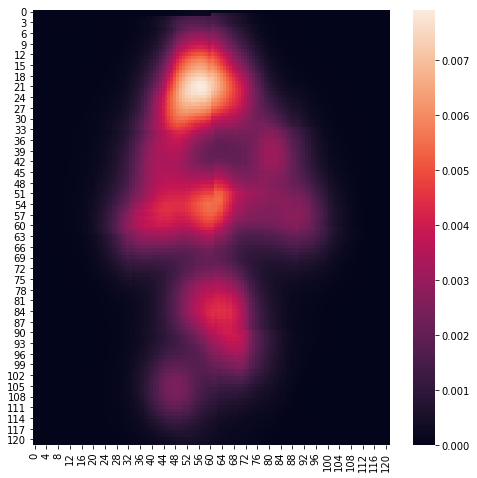

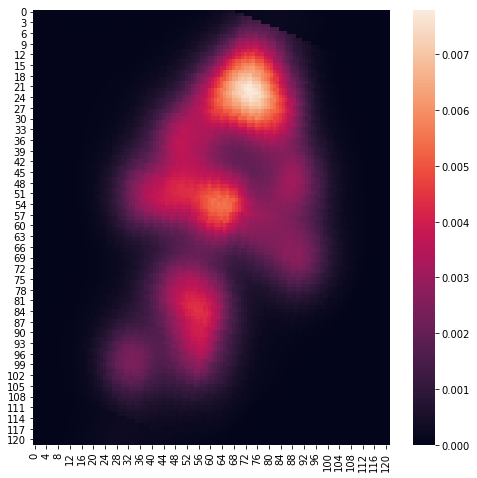

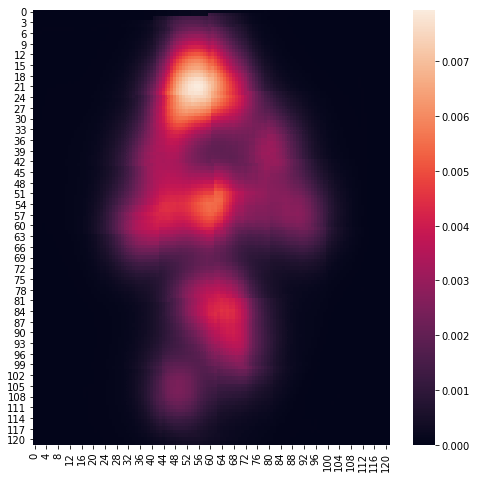

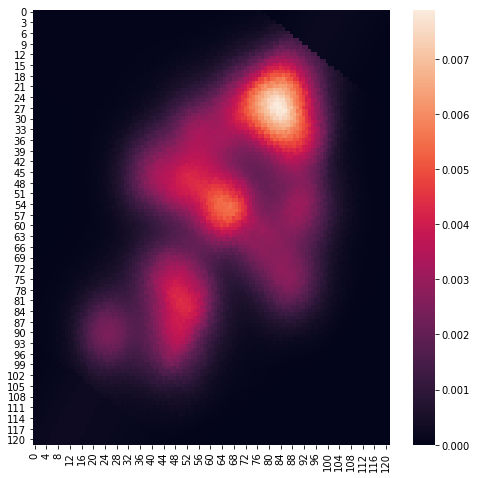

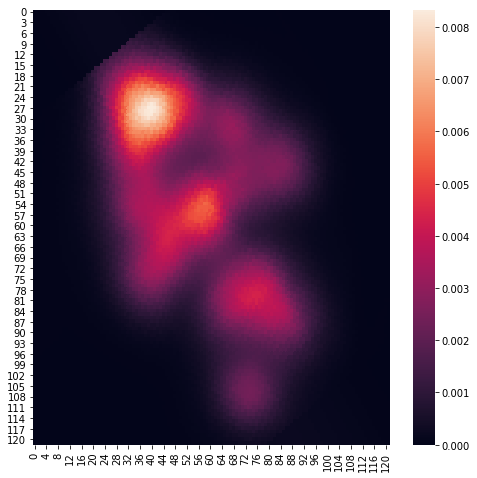

...

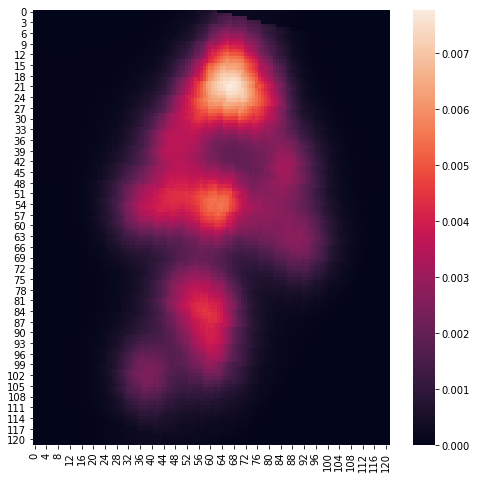

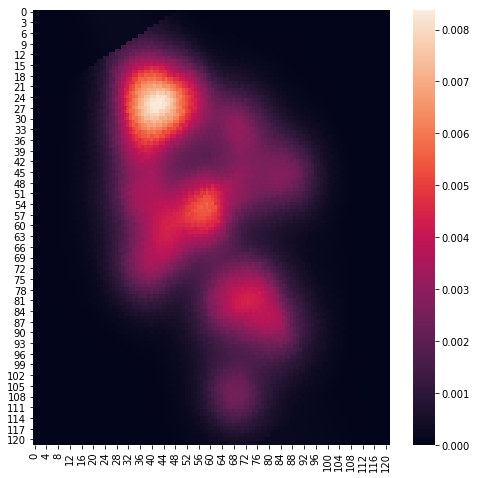

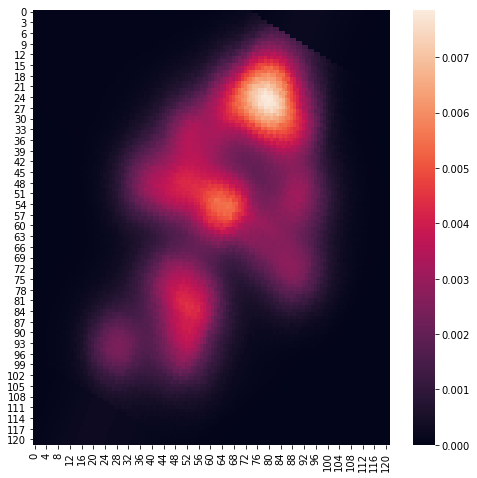

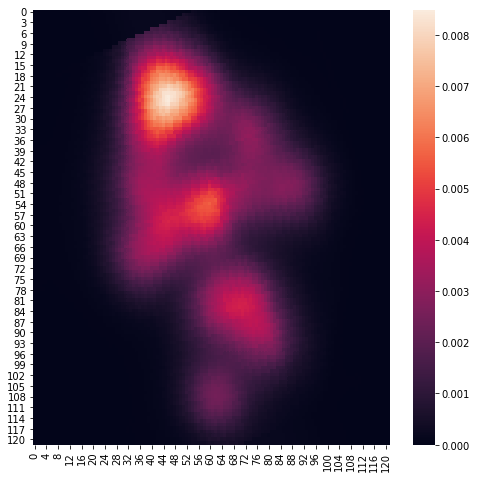

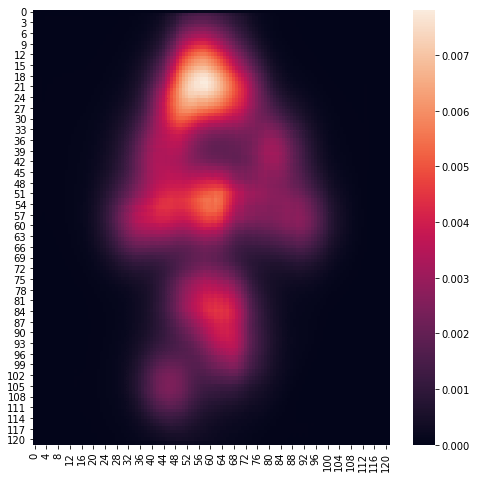

In [406]:
for i in range(heatmaps.shape[0]):
    fig=plt.figure(figsize=(8,8))
    sns.heatmap(heatmaps[i].sum(axis=0).cpu().numpy())

In [407]:
hm  = heatmaps.sum(axis=0)/heatmaps.shape[0]

In [384]:
kp = gaussian2kp(hm.unsqueeze(0))["value"]

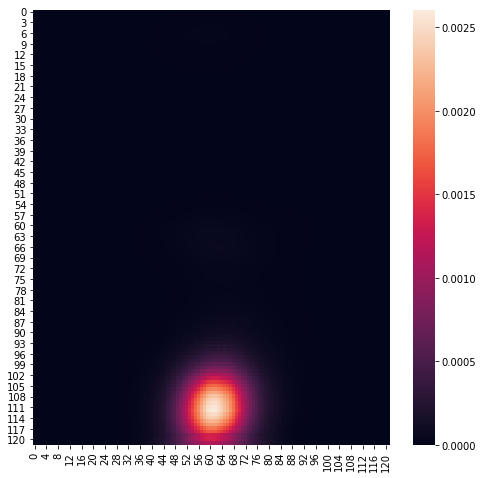

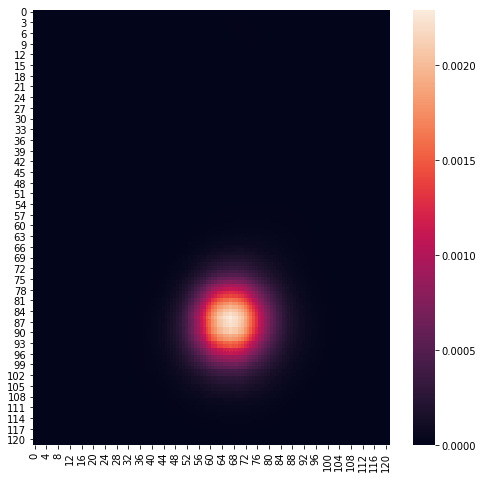

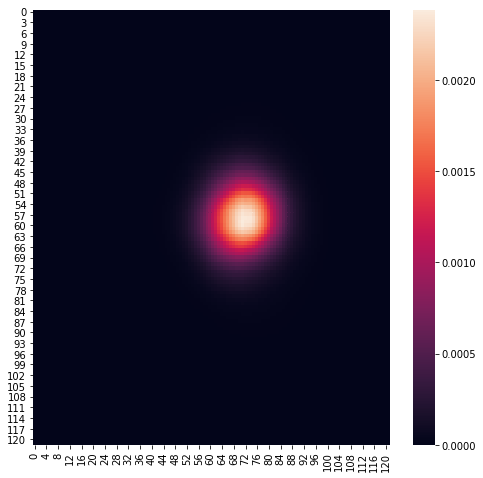

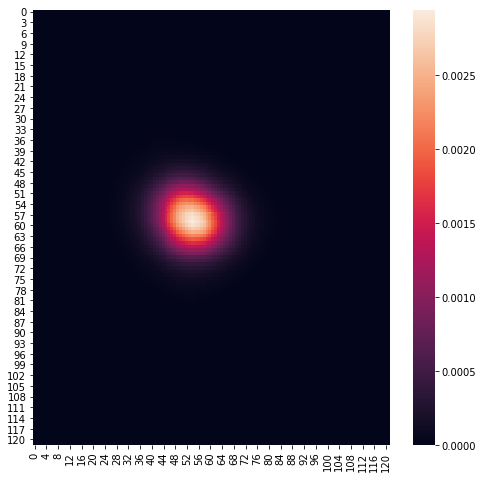

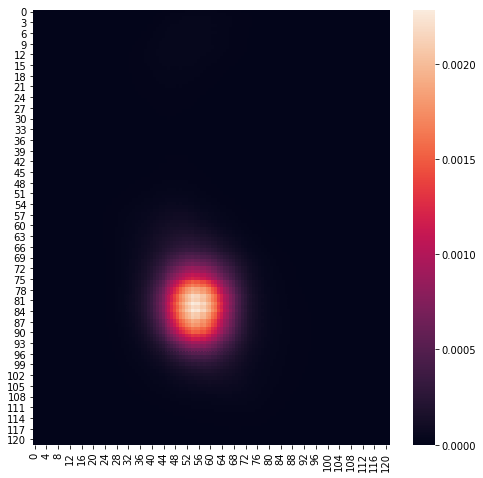

...

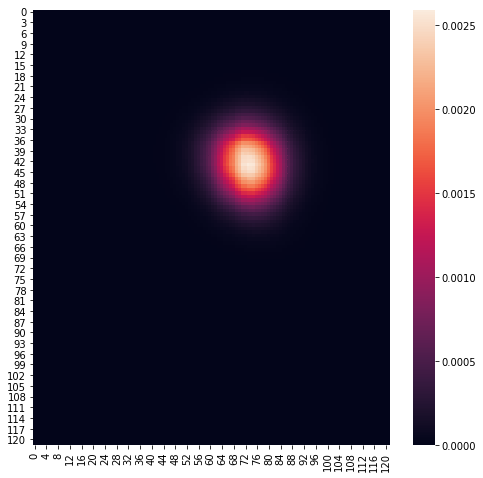

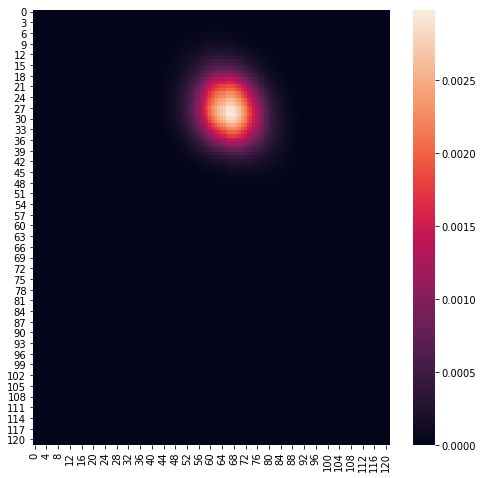

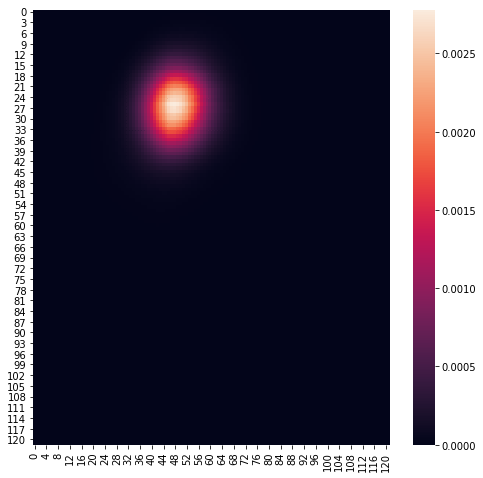

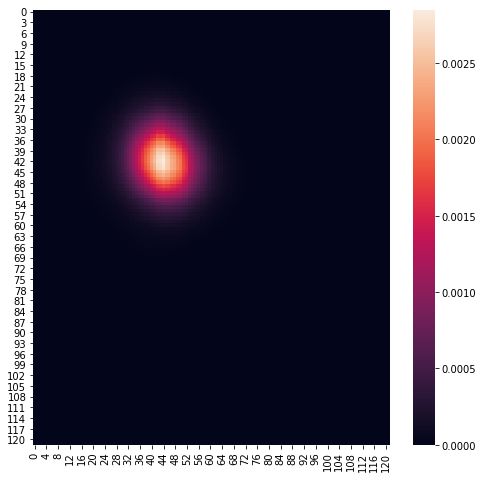

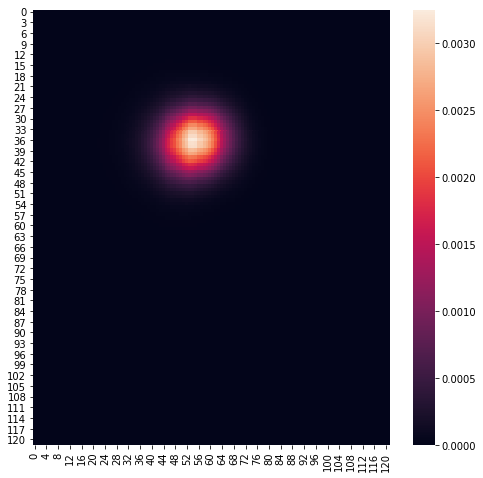

In [378]:
for i in range(hm.shape[0]):
    fig=plt.figure(figsize=(8,8))
    sns.heatmap(hm[i].cpu().numpy())

In [ ]:
sns.heatmap(hm.sum(axis=0).cpu().numpy())

 Difference of Keypoint extraction between simple average and  mean among kps, the first one use heatmaps while the other is based on the kp average

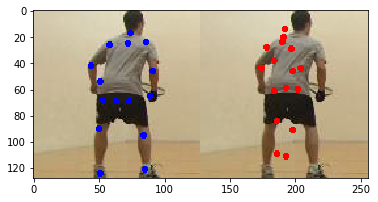

In [385]:
## kp using the heatmaps
kps = kp[0]
img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(kps), color='red')), axis=2)
plt.imshow(np.rollaxis(img, 0, 3))

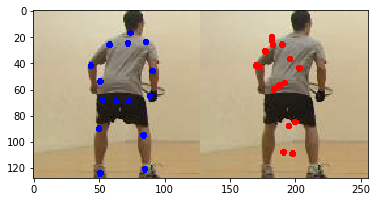

In [386]:
## kp using the mean
kps = kp_lists.mean(axis=0)
img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(kps), color='red')), axis=2)
plt.imshow(np.rollaxis(img, 0, 3))

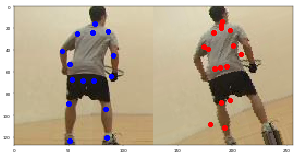

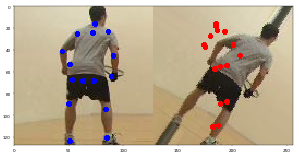

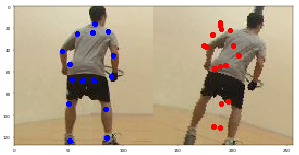

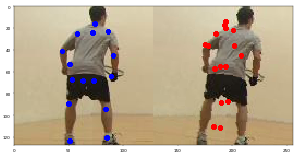

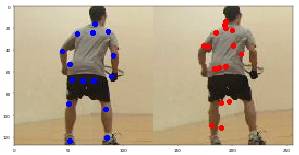

...

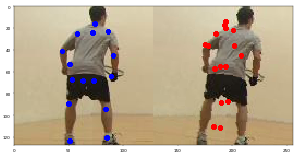

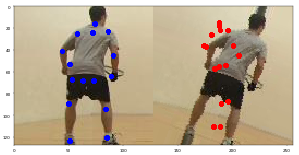

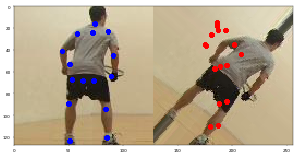

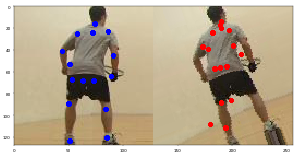

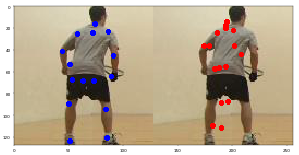

In [387]:
# all the kp extractions 
for concat_img in concat_imgs:
    fig=plt.figure(figsize=(12,8), dpi= 30)
    plt.imshow(np.rollaxis(concat_img, 0, 3))

### Perfomance comparison between kps avg or heatmap average
using the heatmaps to extract the kps seems to lead to better performances, also increase the number of augmentation seems to increase the quality of the prediction

In [32]:
def make_coordinate_grid_local(spatial_size, type):
    """
    Create a meshgrid [-1,1] x [-1,1] of given spatial_size.
    """
    h, w = spatial_size
    x = torch.arange(w).type(type)
    y = torch.arange(h).type(type)

    x = (2 * (x / (w - 1)) - 1)
    y = (2 * (y / (h - 1)) - 1)

    yy = y.view(-1, 1).repeat(1, w)
    xx = x.view(1, -1).repeat(h, 1)

    meshed = torch.cat([xx.unsqueeze_(2), yy.unsqueeze_(2)], 2)

    return meshed

In [79]:
def gaussian2kp_local(heatmap, clip_variance=None):
    """
    Extract the mean and the variance from a heatmap
    """
    shape = heatmap.shape
    #adding small eps to avoid 'nan' in variance
    kp = {}
    kp['var'] = torch.var(heatmap,(2,3))
    heatmap = heatmap.unsqueeze(-1) + 1e-7
    grid_ = make_coordinate_grid_local(shape[2:], heatmap.type())
    grid = grid_.unsqueeze(0).unsqueeze(0)

    mean_ = (heatmap * grid)
    mean = mean_.sum(dim=(2, 3))

    kp['mean'] =  mean 


    return kp

In [214]:
def evaluate_multiple(model, loader, dset='mpii', filter=None, device='cuda', use_heatmaps=False, num_augmentation=10 ):
    model.eval()
    pck_scores = list()
    scores = list()
    concat_imgs = []
    count = 0.
    k = 1
    variance =  torch.Tensor([])
    losses_total = torch.Tensor([])
    with torch.no_grad():
        for batch in tqdm(loader):
            try:
                mask = batch['kp_mask'].to(device)
            except:
                mask = None
            heatmaps = torch.Tensor([]).to(device)
            kp_lists = torch.Tensor([]).to(device)
            losses = torch.Tensor([])

            for _ in range(num_augmentation):
                range_angle = 45
                angle = random.randint(-1*range_angle,range_angle)
                rot_img = batch_image_rotation(batch['imgs'], angle)
                rot_img = rot_img.to(device)
                out = model_kp_detector(rot_img)
                if filter is not None:
                    if use_heatmaps:
                        heatmaps = torch.cat((heatmaps, batch_image_rotation(out["heatmaps"], -angle).unsqueeze(1)), axis=1 )
                    else:
                        kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"], -angle).unsqueeze(1)), axis=1 )    
                else:
                    if use_heatmaps:
                        heatmaps = torch.cat((heatmaps, batch_image_rotation(out["heatmaps"], -angle).unsqueeze(1)), axis=1 )
                    else:
                        kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"], -angle).unsqueeze(1)), axis=1 )

            # print(heatmaps.shape) [batch, n_aug, nkp, w_hm, h_hm]            
            if use_heatmaps:
                
                for n_aug in range(heatmaps.shape[1]):
                    loss = l1_loss(heatmaps[:,n_aug],heatmaps[:,0])
                    losses = torch.cat((losses, loss.unsqueeze(0).cpu()), 0)

                    #losses.append(l1_loss(heatmaps[:,n_aug],heatmaps[:,0]).mean())
                losses = losses.mean(0)
                losses_total = torch.cat((losses_total, losses), 0)

                hm  = heatmaps.sum(axis=1)/heatmaps.shape[1] # [batch, nkp, w_hm, h_hm]
                kps = gaussian2kp_local(hm)
                out['value'] = kps["mean"] 
                out["var"] = kps["var"][:,filter]
                variance = torch.cat((variance, out["var"].mean(1).cpu()), 0)
                #print(out["var"].mean(1).shape)
                #break
            else:
                out['value'] = kp_lists.mean(axis=1)
                
            
            if filter is not None:
                pck_score = batch_PCK(out['value'][:,filter], batch['annots'].to(device), dset=dset, mask=mask)
                score = batch_MSE(out['value'][:,filter], batch['annots'].to(device), mask=mask)
            else:
                pck_score = batch_PCK(out['value'], batch['annots'].to(device), dset=dset, mask=mask)
                score = batch_MSE(out['value'], batch['annots'].to(device), mask=mask) 
            scores.append(score)
            pck_scores.append(pck_score)
            count += batch['imgs'].shape[0]


            if filter is not None:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            else:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][k]), color='red')), axis=2)

            concat_imgs.append({"img" : concat_img, "var" : out["var"].mean(1)[k], "loss":  losses[k] })

    mse = torch.Tensor(scores).sum()/count
    pck = torch.Tensor(pck_scores).mean()
    out = {
            'MSE':mse.item(),
            'PCK':pck.item(),
            }
    model.train()
    return out, concat_imgs, variance, losses_total

### Variance Analysis

100%|██████████| 125/125 [00:33<00:00,  3.69it/s]


(array([  3.,   8.,  12.,  27.,  28.,  53.,  73.,  90., 105., 101., 129.,
        127., 109., 114., 123., 102., 107.,  86.,  65.,  77.,  60.,  53.,
         44.,  40.,  36.,  26.,  18.,  22.,  20.,  13.,  17.,  13.,  20.,
          8.,  10.,   8.,  11.,   2.,   6.,   3.,   8.,   7.,   1.,   2.,
          0.,   0.,   1.,   0.,   0.,   1.,   1.,   3.,   1.,   1.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   1.,
          0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,
          1.]),
 array([8.77265194e-09, 9.22343890e-09, 9.67422586e-09, 1.01250128e-08,
        1.05757998e-08, 1.10265868e-08, 1.14773737e-08, 1.19281607e-08,
        1.23789476e-08, 1.28297346e-08, 1.32805216e-08, 1.37313085e-08,
        1.41820955e-08, 1.46328816e-08, 1.50836694e-08, 1.55344555e-08,
        1.59852434e-08, 1.6436

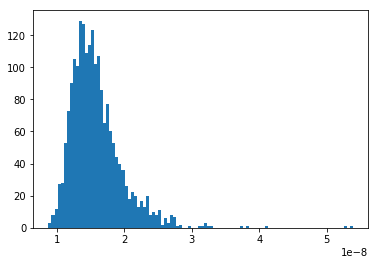

In [102]:
##### SOURCE ONLY MODEL
# res : {'MSE': 0,304548978805542, 'PCK': 0,124724604189395}
## heatmap performance averaged over 10 augmentation
out, imgs_hm, variance= evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=10)

In [151]:
## increasing the augmentation lead to better overall performances
out, imgs_hm, variance= evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=30)

100%|██████████| 125/125 [01:38<00:00,  1.27it/s]


(array([ 3.,  3.,  8.,  5., 13., 14., 19., 37., 35., 57., 52., 76., 71.,
        90., 91., 90., 92., 87., 84., 80., 93., 73., 78., 67., 59., 66.,
        61., 36., 42., 34., 53., 24., 15., 27., 24., 27., 17., 30., 16.,
        14., 14., 10.,  9.,  8., 11., 10.,  6.,  5.,  3., 10.,  6.,  9.,
         4.,  1.,  3.,  1.,  1.,  4.,  2.,  0.,  1.,  0.,  2.,  1.,  1.,
         0.,  1.,  2.,  1.,  1.,  3.,  0.,  1.,  1.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  1.,
         0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  1.]),
 array([8.69161809e-09, 8.97467967e-09, 9.25774124e-09, 9.54080370e-09,
        9.82386528e-09, 1.01069269e-08, 1.03899884e-08, 1.06730509e-08,
        1.09561125e-08, 1.12391740e-08, 1.15222356e-08, 1.18052981e-08,
        1.20883596e-08, 1.23714212e-08, 1.26544828e-08, 1.29375453e-08,
        1.32206068e-08, 1.35036684e-08, 1.37867300e-08, 1.40697924e-08,
        1.43528540e-08, 1.46359156e-08, 1.49189781e-08, 1.52020387e-08,
  

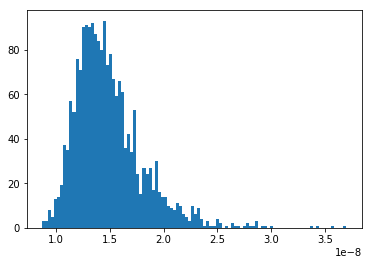

In [152]:
%matplotlib inline
#increasing the variance increase also the 
plt.hist(list(variance),bins=100)

In [153]:
vr = []
for k in range(len(imgs_hm)):
    vr.append(imgs_hm[k]["var"].cpu().numpy())
vr = np.array(vr)
vr.argmax()

105

tensor(2.3824e-08, device='cuda:0')


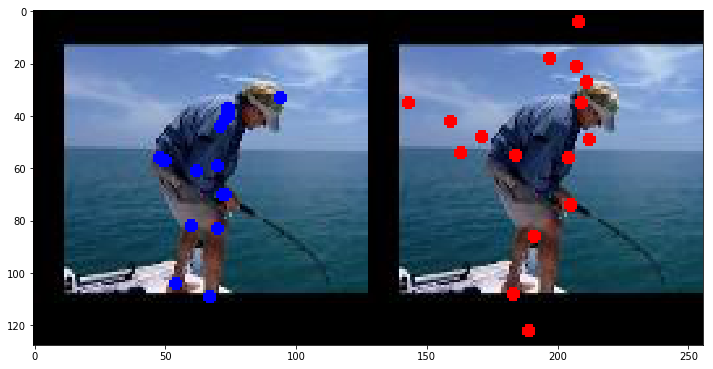

In [154]:
index = vr.argmax()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(9.5155e-09, device='cuda:0')


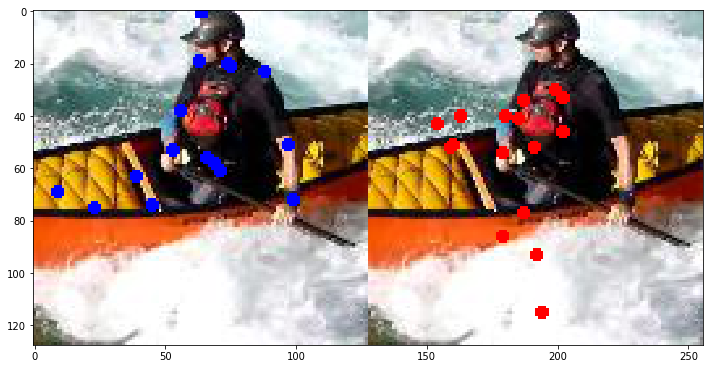

In [155]:
index = vr.argmin()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

##### Test with already adapted model

In [157]:
out, imgs_hm, variance= evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=30)

100%|██████████| 125/125 [01:38<00:00,  1.27it/s]


(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  2.,  2.,  1.,
         0.,  2.,  4.,  6.,  1.,  8.,  4.,  5.,  9.,  6., 14., 11., 17.,
        20., 15., 18., 28., 26., 23., 26., 27., 46., 36., 35., 33., 41.,
        40., 44., 52., 46., 48., 57., 48., 44., 62., 59., 52., 55., 39.,
        64., 52., 37., 43., 48., 51., 31., 33., 48., 49., 43., 34., 27.,
        29., 30., 27., 29., 26., 13., 21., 25., 27., 15.,  8., 11.,  3.,
         8., 10.,  7.,  5.,  4.,  5.,  3.,  4.,  1.,  1.,  3.,  0.,  0.,
         2.,  1.,  1.,  2.,  1.,  1.,  1.,  0.,  1.]),
 array([3.2071451e-08, 3.2308012e-08, 3.2544577e-08, 3.2781138e-08,
        3.3017702e-08, 3.3254263e-08, 3.3490828e-08, 3.3727389e-08,
        3.3963950e-08, 3.4200514e-08, 3.4437075e-08, 3.4673640e-08,
        3.4910201e-08, 3.5146765e-08, 3.5383326e-08, 3.5619887e-08,
        3.5856452e-08, 3.6093013e-08, 3.6329578e-08, 3.6566139e-08,
        3.6802703e-08, 3.7039264e-08, 3.7275825e-08, 3.7512390e-08,
        3.7748951e-08, 3.7

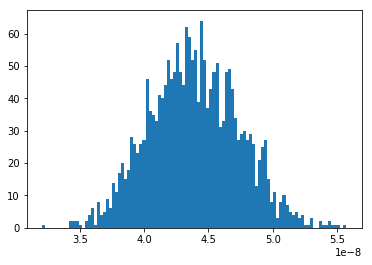

In [158]:
plt.hist(list(variance),bins=100)

In [177]:
len(variance[variance<4.5e-8])

#filter(lambda variance: variance > 4.5e-8, variance)

1255

(array([1., 1., 0., 1., 2., 2., 0., 0., 1., 2., 1., 4., 3., 2., 2., 6., 3.,
        5., 4., 5., 3., 8., 5., 1., 3., 1., 5., 4., 5., 2., 4., 2., 4., 4.,
        4., 2., 2., 2., 4., 1., 1., 1., 3., 2., 1., 2., 0., 2., 0., 2.]),
 array([3.5769744e-08, 3.6081076e-08, 3.6392407e-08, 3.6703735e-08,
        3.7015067e-08, 3.7326398e-08, 3.7637729e-08, 3.7949057e-08,
        3.8260389e-08, 3.8571720e-08, 3.8883051e-08, 3.9194379e-08,
        3.9505711e-08, 3.9817042e-08, 4.0128374e-08, 4.0439701e-08,
        4.0751033e-08, 4.1062364e-08, 4.1373696e-08, 4.1685023e-08,
        4.1996355e-08, 4.2307686e-08, 4.2619018e-08, 4.2930346e-08,
        4.3241677e-08, 4.3553008e-08, 4.3864340e-08, 4.4175671e-08,
        4.4486999e-08, 4.4798330e-08, 4.5109662e-08, 4.5420993e-08,
        4.5732321e-08, 4.6043652e-08, 4.6354984e-08, 4.6666315e-08,
        4.6977643e-08, 4.7288975e-08, 4.7600306e-08, 4.7911637e-08,
        4.8222965e-08, 4.8534297e-08, 4.8845628e-08, 4.9156959e-08,
        4.9468287e-08, 4.9

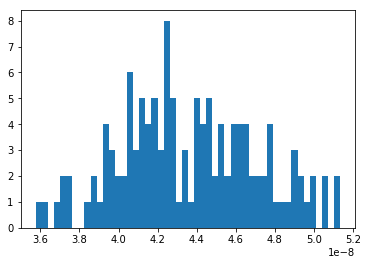

In [182]:
vr = []
for k in range(len(imgs_hm)):
    vr.append(imgs_hm[k]["var"].cpu().numpy())
vr = np.array(vr)
plt.hist(vr, bins=50)

tensor(5.1336e-08, device='cuda:0')


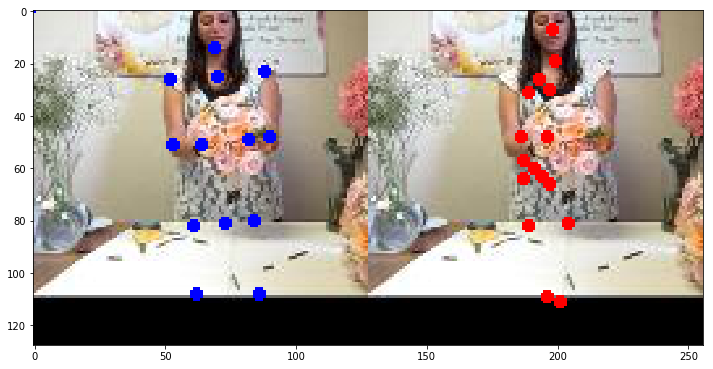

In [164]:
index = vr.argmax()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(3.5770e-08, device='cuda:0')


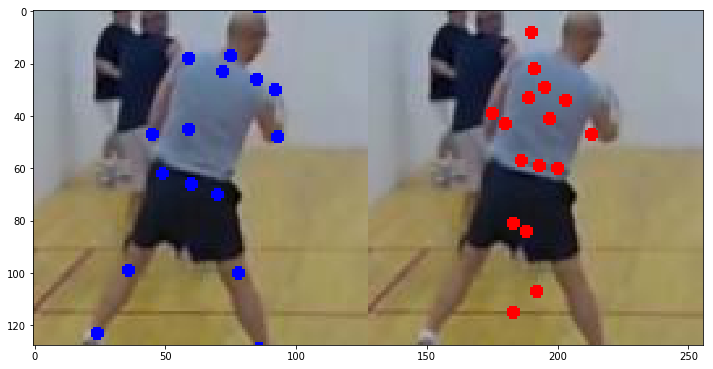

In [165]:
index = vr.argmin()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(3.9465e-08, device='cuda:0')


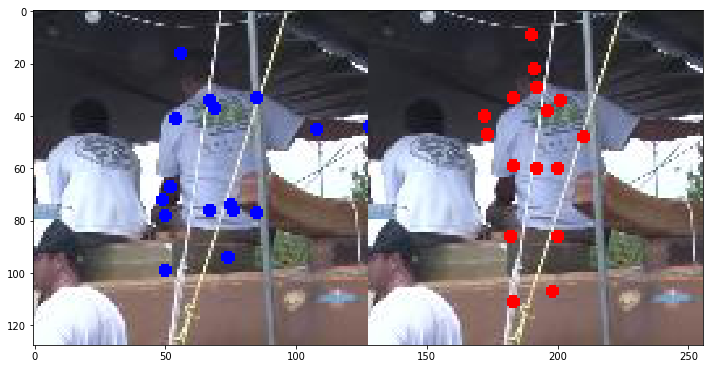

In [179]:
index = 10
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(4.1398e-08, device='cuda:0')


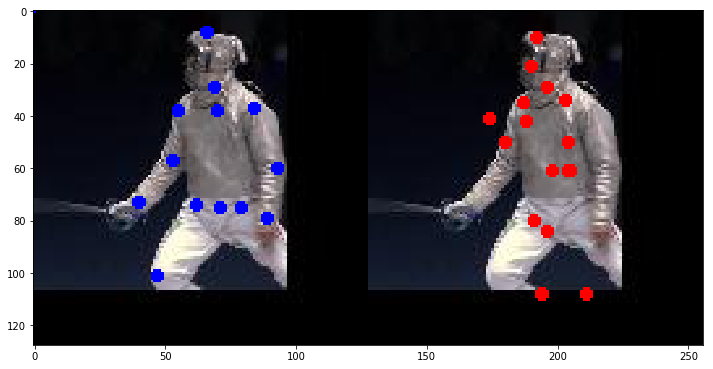

In [181]:
index = 30
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

### Loss selection Analysis
Overall variance seems a bit more reliable

In [215]:
out, imgs_hm, variance, losses = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=10)

100%|██████████| 125/125 [00:34<00:00,  3.63it/s]


(array([ 2.,  0.,  2.,  3.,  2.,  1.,  4.,  7.,  5.,  5.,  3.,  4.,  8.,
        11.,  9., 12., 15., 18., 25., 26., 25., 26., 24., 31., 43., 38.,
        34., 36., 50., 63., 49., 60., 54., 55., 52., 57., 42., 62., 39.,
        45., 54., 39., 49., 51., 38., 57., 50., 30., 47., 39., 28., 34.,
        33., 37., 34., 23., 26., 31., 30., 17., 19., 21., 17., 17., 16.,
         6., 15.,  6.,  6.,  8.,  7.,  8.,  9.,  9.,  6.,  3.,  3.,  1.,
         2.,  1.,  4.,  5.,  2.,  3.,  2.,  0.,  1.,  0.,  1.,  1.,  1.,
         2.,  1.,  1.,  1.,  0.,  0.,  0.,  0.,  1.]),
 array([3.3155938e-08, 3.3461177e-08, 3.3766412e-08, 3.4071650e-08,
        3.4376889e-08, 3.4682127e-08, 3.4987362e-08, 3.5292601e-08,
        3.5597839e-08, 3.5903074e-08, 3.6208313e-08, 3.6513551e-08,
        3.6818790e-08, 3.7124025e-08, 3.7429263e-08, 3.7734502e-08,
        3.8039737e-08, 3.8344975e-08, 3.8650214e-08, 3.8955449e-08,
        3.9260687e-08, 3.9565926e-08, 3.9871164e-08, 4.0176399e-08,
        4.0481638e-08, 4.0

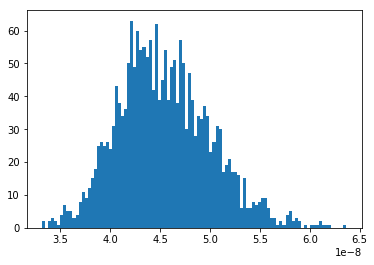

In [216]:
plt.hist(list(variance),bins=100)

(array([ 2.,  1.,  2.,  4.,  2.,  1.,  3.,  7.,  1.,  6.,  7., 12.,  8.,
        14., 22., 16., 23., 17., 14., 22., 19., 25., 22., 31., 27., 42.,
        41., 31., 39., 39., 41., 37., 50., 38., 37., 45., 43., 42., 53.,
        44., 51., 45., 41., 43., 56., 37., 44., 45., 45., 37., 36., 38.,
        20., 31., 27., 26., 34., 25., 36., 11., 32., 20., 19., 17., 20.,
        16., 21., 13., 13., 13.,  8., 14., 12., 12.,  5., 10.,  6.,  7.,
         7., 12.,  6.,  6.,  6.,  8.,  1.,  4.,  6.,  1.,  8.,  3.,  3.,
         0.,  2.,  1.,  3.,  3.,  1.,  0.,  1.,  2.]),
 array([ 8.641181,  8.951087,  9.260992,  9.570898,  9.880804, 10.19071 ,
        10.500615, 10.810521, 11.120427, 11.430333, 11.740238, 12.050144,
        12.36005 , 12.669955, 12.979861, 13.289767, 13.599673, 13.909578,
        14.219484, 14.52939 , 14.839296, 15.149201, 15.459107, 15.769013,
        16.078918, 16.388824, 16.69873 , 17.008636, 17.318542, 17.628448,
        17.938353, 18.248259, 18.558165, 18.86807 , 19.177977, 1

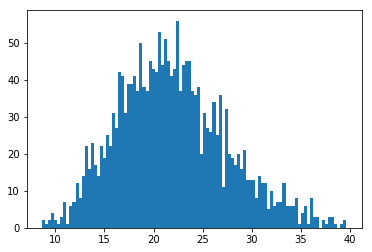

In [217]:
plt.hist(list(losses),bins=100)

(array([1., 0., 1., 0., 1., 0., 1., 2., 4., 2., 3., 3., 4., 1., 2., 4., 5.,
        2., 4., 5., 4., 2., 3., 3., 4., 5., 7., 5., 2., 2., 2., 2., 2., 6.,
        2., 5., 6., 1., 2., 3., 3., 1., 0., 0., 1., 1., 0., 3., 2., 1.]),
 array([ 9.666237 , 10.15515  , 10.644064 , 11.1329775, 11.621891 ,
        12.1108055, 12.599719 , 13.088633 , 13.577546 , 14.06646  ,
        14.555373 , 15.044287 , 15.5332   , 16.022114 , 16.511028 ,
        16.99994  , 17.488855 , 17.97777  , 18.466682 , 18.955597 ,
        19.44451  , 19.933424 , 20.422337 , 20.911251 , 21.400164 ,
        21.889078 , 22.377993 , 22.866905 , 23.35582  , 23.844732 ,
        24.333647 , 24.82256  , 25.311474 , 25.800386 , 26.2893   ,
        26.778215 , 27.267128 , 27.756042 , 28.244955 , 28.73387  ,
        29.222782 , 29.711697 , 30.200611 , 30.689524 , 31.178438 ,
        31.66735  , 32.156265 , 32.64518  , 33.13409  , 33.623005 ,
        34.11192  ], dtype=float32),
 <a list of 50 Patch objects>)

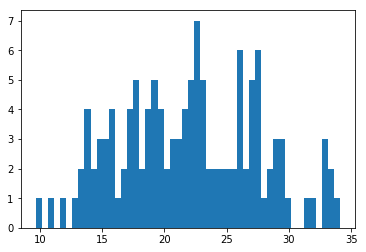

In [218]:
losses = []
for k in range(len(imgs_hm)):
    losses.append(imgs_hm[k]["loss"].cpu().numpy())
losses = np.array(losses)
plt.hist(losses, bins=50)

tensor(3.9652e-08, device='cuda:0')


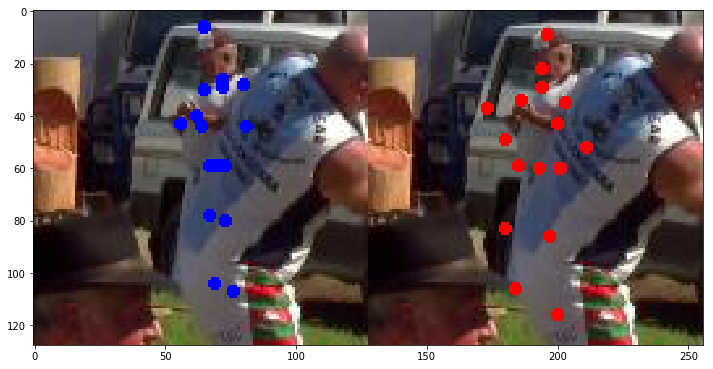

In [219]:
index = vr.argmax()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(34.1119)


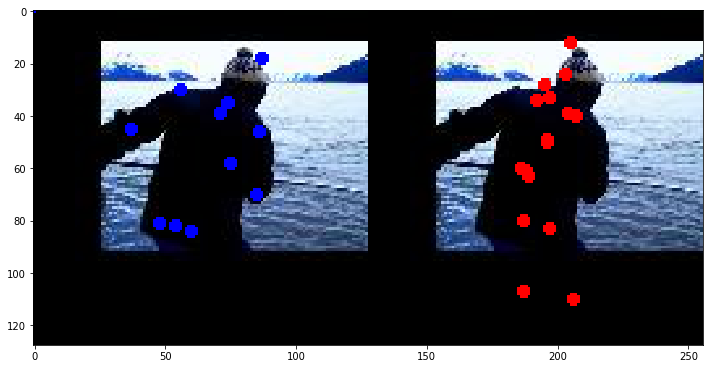

In [223]:
index = losses.argmax()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["loss"].mean(0))

tensor(5.5167e-08, device='cuda:0')


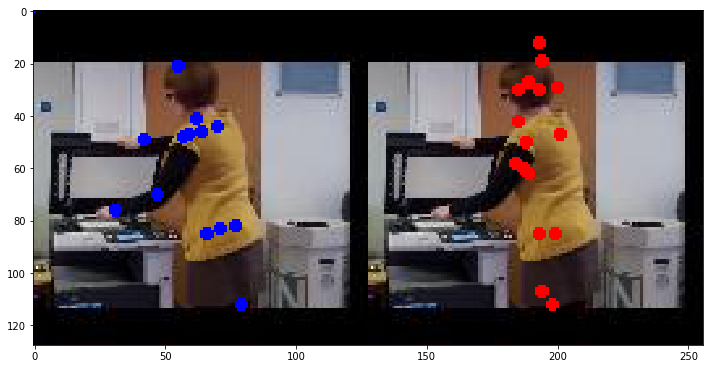

In [221]:
index = vr.argmin()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["var"].mean(0))

tensor(9.6662)


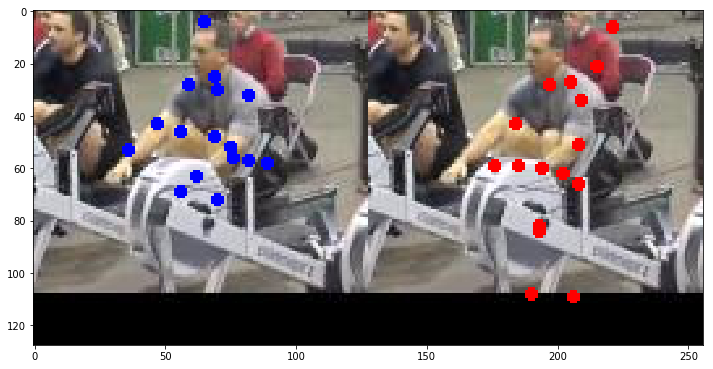

In [224]:
index = losses.argmin()
data = imgs_hm[index]["img"]
data = np.rollaxis(data, 0, 3)
fig=plt.figure(figsize=(12,8))
plt.imshow(data)
print(imgs_hm[index]["loss"].mean(0))

### Performance with different number of augmentation

In [27]:
## heatmap performance averaged over 10 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=10 )
out

100%|██████████| 125/125 [01:09<00:00,  1.79it/s]


{'MSE': 0.1372825801372528, 'PCK': 0.25097429752349854}

In [31]:
## heatmap performance averaged over 20 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=20)
out

100%|██████████| 125/125 [02:12<00:00,  1.06s/it]


{'MSE': 0.1349841207265854, 'PCK': 0.2537749409675598}

In [32]:
## heatmap performance averaged over 30 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=30)
out

100%|██████████| 125/125 [03:16<00:00,  1.57s/it]


{'MSE': 0.1344439834356308, 'PCK': 0.255598783493042}

In [33]:
## heatmap performance averaged over 40 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=40)
out

100%|██████████| 125/125 [04:22<00:00,  2.10s/it]


{'MSE': 0.1339564025402069, 'PCK': 0.2569216191768646}

In [22]:
## kp performance averaged over 10 augmentation
metrics, imgs_kp = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map,  device="cuda:0",use_heatmaps=False)
metrics

100%|██████████| 125/125 [01:05<00:00,  1.91it/s]


{'MSE': 0.1372997760772705, 'PCK': 0.24769596755504608}

In [28]:
# original model performance
eval_file = '/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/evaluation.json'
json.load(open(eval_file))

{'MSE': 0.13743118941783905, 'PCK': 0.25981777906417847}

In [49]:
# test with different model
# original performance res : {'MSE': 0.1493089497089386, 'PCK': 0.22686398029327393}
## heatmap performance averaged over 40 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=40)
out

100%|██████████| 125/125 [02:11<00:00,  1.05s/it]


{'MSE': 0.14362196624279022, 'PCK': 0.2337232530117035}

In [15]:
# test with different model with 
# res : {'MSE': 0.1369175761938095, 'PCK': 0.2560108006000519}
## heatmap performance averaged over 40 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=50)
out

100%|██████████| 125/125 [02:12<00:00,  1.06s/it]


{'MSE': 0.13323470950126648, 'PCK': 0.2585856020450592}

In [16]:
# test with different model with 
# res : {'MSE': 0.1369175761938095, 'PCK': 0.2560108006000519}
## heatmap performance averaged over 50 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=50)
out

100%|██████████| 125/125 [02:51<00:00,  1.37s/it]


{'MSE': 0.1327999085187912, 'PCK': 0.2602258324623108}

In [17]:
# test with different model with 
# res : {'MSE': 0.1369175761938095, 'PCK': 0.2560108006000519}
## heatmap performance averaged over 80 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=80)
out

100%|██████████| 125/125 [04:45<00:00,  2.28s/it]


{'MSE': 0.13260981440544128, 'PCK': 0.26067498326301575}

In [26]:
##### SOURCE ONLY MODEL
# res : {'MSE': 0,304548978805542, 'PCK': 0,124724604189395}
## heatmap performance averaged over 10 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=10)
out

100%|██████████| 125/125 [00:33<00:00,  3.72it/s]


{'MSE': 0.26465702056884766, 'PCK': 0.1337030977010727}

In [72]:
##### SOURCE ONLY MODEL
# res : {'MSE': 0,304548978805542, 'PCK': 0,124724604189395}
## kp mean performance averaged over 10 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=False, num_augmentation=10)
out

100%|██████████| 125/125 [00:31<00:00,  3.96it/s]


{'MSE': 0.2692886292934418, 'PCK': 0.13269437849521637}

In [27]:
##### SOURCE ONLY MODEL
# res : {'MSE': 0,304548978805542, 'PCK': 0,124724604189395}
## heatmap performance averaged over 30 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=30)
out

100%|██████████| 125/125 [01:38<00:00,  1.27it/s]


{'MSE': 0.2582985758781433, 'PCK': 0.1407562792301178}

In [28]:
##### SOURCE ONLY MODEL
# res : {'MSE': 0,304548978805542, 'PCK': 0,124724604189395}
## heatmap performance averaged over 80 augmentation
out, imgs_hm = evaluate_multiple(model_kp_detector,loader_test, filter=kp_map, device="cuda", use_heatmaps=True, num_augmentation=80)
out

100%|██████████| 125/125 [04:43<00:00,  2.27s/it]


{'MSE': 0.25732165575027466, 'PCK': 0.139797180891037}

## Penn Label Generation
test over penn dataset with the model trained on mpii 
I was just curious to see how it performs

In [183]:
m = models[0]
m["model_path"] = "/home/rfranceschini/usc2dk/source_model/mpii/source_levi/log_-checkpoint-500.pth.tar" 
with open(m["config"]) as f:
        config = yaml.load(f)
        config['model_params']['kp_detector_params']['num_kp'] = 16
##### Model instantiation
model_kp_detector = KPDetector(**config['model_params']['kp_detector_params']) 
model_kp_detector.to(device_id) 
#model_kp_detector = model_kp_detector.cuda()
try:
    print(f"loading {m['model_path']}")
    kp_state_dict = torch.load(m["model_path"])
    print('Source model loaded: %s' % m["model_path"])
except:
    print('Failed to read model %s' % m["model_path"])
    exit(1)
try:
    model_kp_detector.load_state_dict(kp_state_dict['model_kp_detector'])
except:
    print('failed to load model weights')
    exit(1)
    config['train_params']['dataset'] = opt.tgt

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/ipykernel_launcher.py:4: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  after removing the cwd from sys.path.


n_kp : 16
loading /home/rfranceschini/usc2dk/source_model/mpii/source_levi/log_-checkpoint-500.pth.tar
Source model loaded: /home/rfranceschini/usc2dk/source_model/mpii/source_levi/log_-checkpoint-500.pth.tar


In [184]:
loader_test = LoadPennAction(**config['datasets']['penn_test'])
kp_map = MPII_TO_PENN #HUMANS_TO_PENN

2327it [00:00, 2636.49it/s]

Loading PennAction: /data/rfranceschini/dataset/PennAction/PennAction_128 split: test


In [200]:
filter= kp_map
device = "cuda:0"
k=0
num_augmentation = 10

In [342]:
concat_imgs = []
kp_lists = torch.Tensor([]).to(device)
heatmaps = torch.Tensor([]).to(device)
with torch.no_grad():
    for batch in tqdm(loader_test):
        for _ in range(num_augmentation):
            
            range_angle = 45
            angle = random.randint(-1*range_angle,range_angle)
            rot_img = batch_image_rotation(batch['imgs'], angle)
            
            out = model_kp_detector(rot_img.to(device))
            if filter is not None:
                kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"][:,filter], -angle)[k].unsqueeze(0)), axis=0 )
                heatmaps = torch.cat((heatmaps, out["heatmaps"][:,filter][k].unsqueeze(0)), axis=0 )

                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(rot_img[k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            else:
                concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                                draw_kp(tensor_to_image(rot_img[k]), unnorm_kp(out['value'][k]), color='red')), axis=2)
                kp_lists = torch.cat((kp_lists, batch_kp_rotation(out["value"], -angle)[k].unsqueeze(0)), axis=0 )
                heatmaps = torch.cat((heatmaps, out["heatmaps"][k].unsqueeze(0)), axis=0 )
    
            
            concat_imgs.append(concat_img)
        out = model_kp_detector(batch['imgs'].to(device))
        try:
            mask = batch['kp_mask'].to(device)
        except:
            mask = None

        
        if filter is not None:
            concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][:,filter][k]), color='red')), axis=2)
            kp_lists = torch.cat((kp_lists, out["value"][:,filter][k].unsqueeze(0)), axis=0)
            heatmaps = torch.cat((heatmaps, out["heatmaps"][:,filter][k].unsqueeze(0)), axis=0 )

        else:
            concat_img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(out['value'][k]), color='red')), axis=2)
            kp_lists = torch.cat((kp_lists, out["value"][k].unsqueeze(0)), axis=0)
            heatmaps = torch.cat((heatmaps, out["heatmaps"][k].unsqueeze(0)), axis=0 )

        concat_imgs.append(concat_img)

        break

  0%|          | 0/4750 [00:00<?, ?it/s]


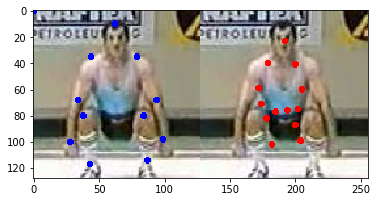

In [343]:
kps = kp_lists.mean(axis=0)
img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(kps), color='red')), axis=2)
plt.imshow(np.rollaxis(img, 0, 3))

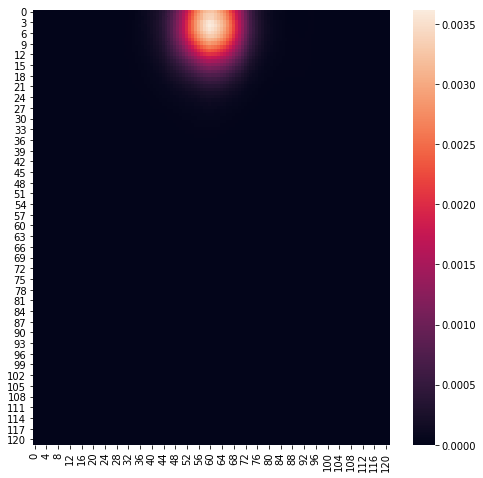

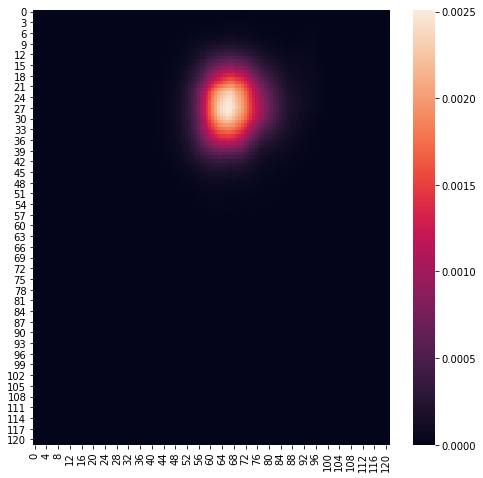

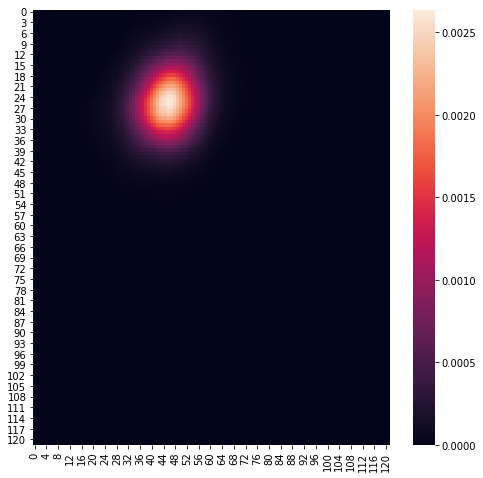

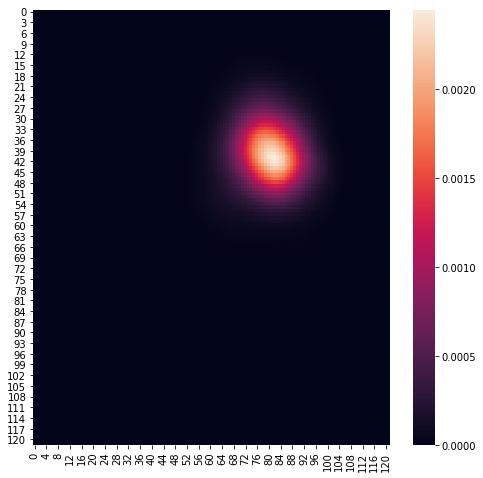

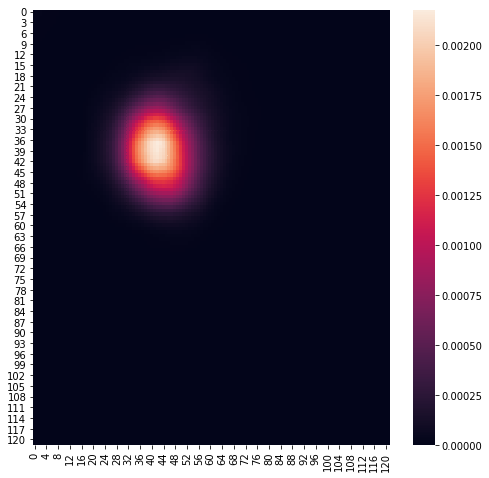

...

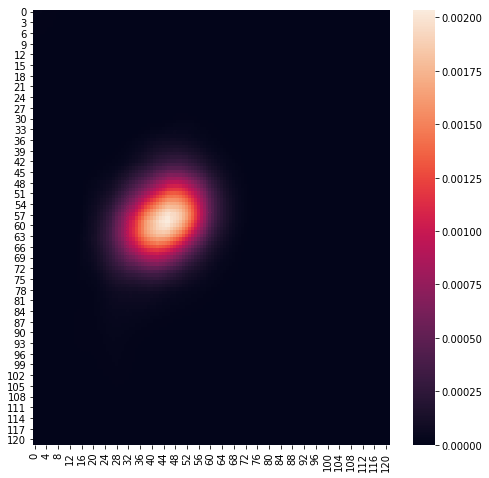

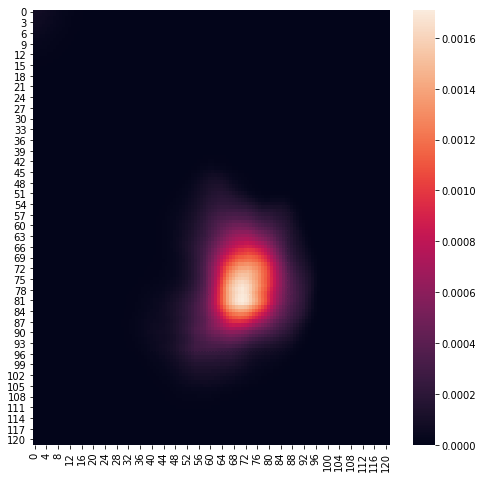

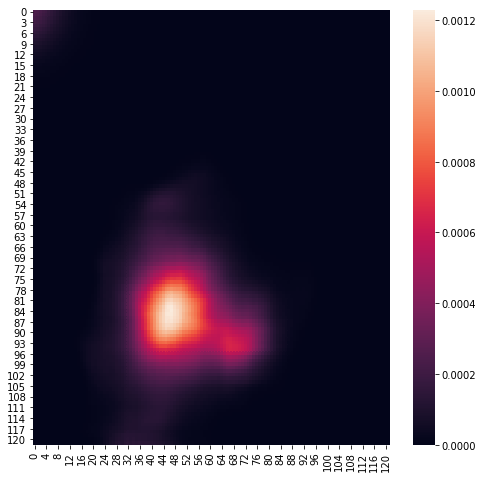

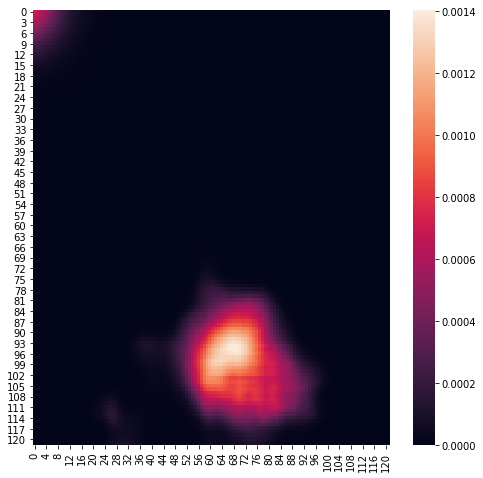

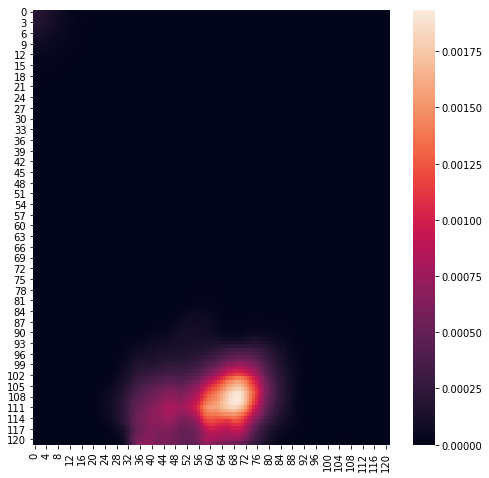

In [332]:
hm  = heatmaps[0]
for i in range(hm.shape[0]):
    fig=plt.figure(figsize=(8,8))
    sns.heatmap(hm[i].cpu().numpy())

    #plt.imshow(hm[i].cpu().numpy())

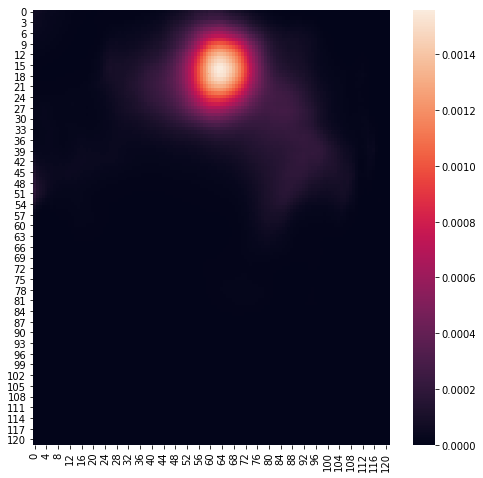

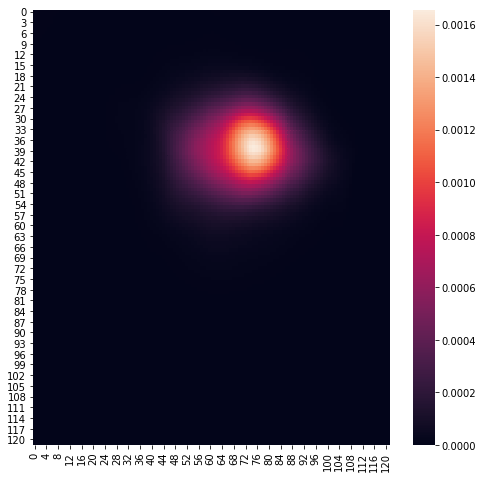

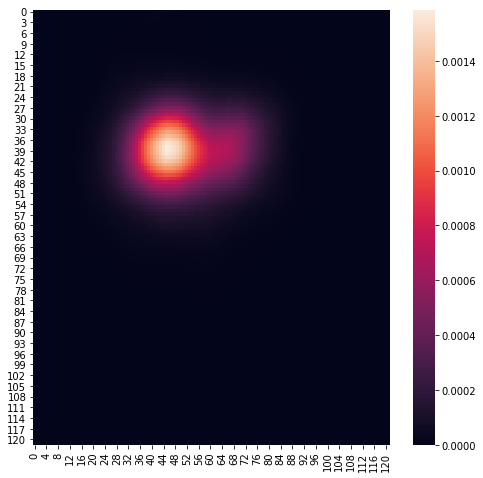

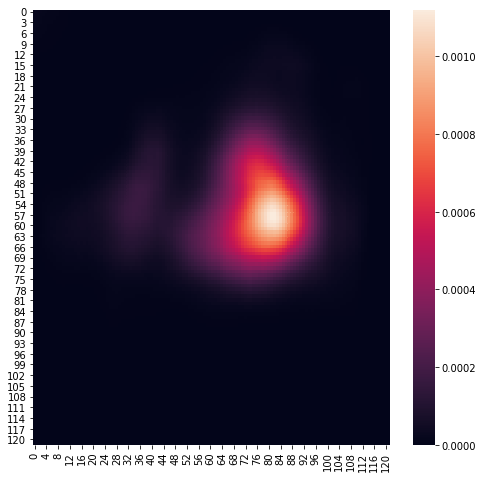

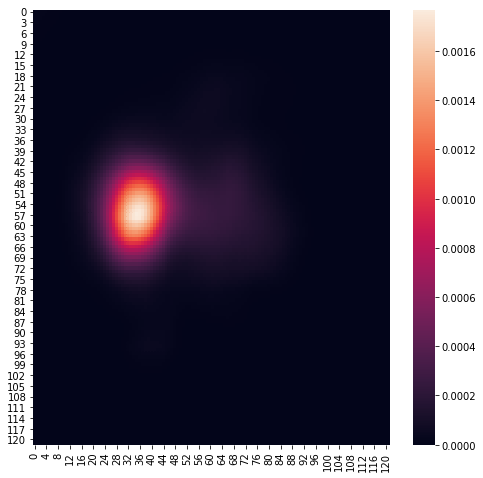

...

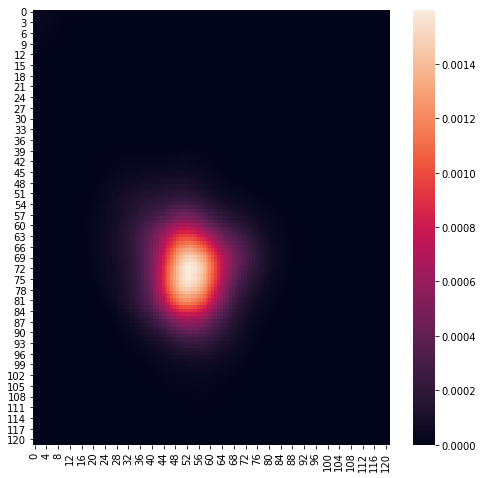

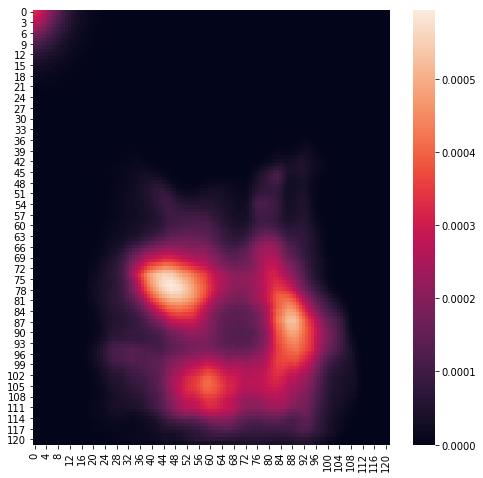

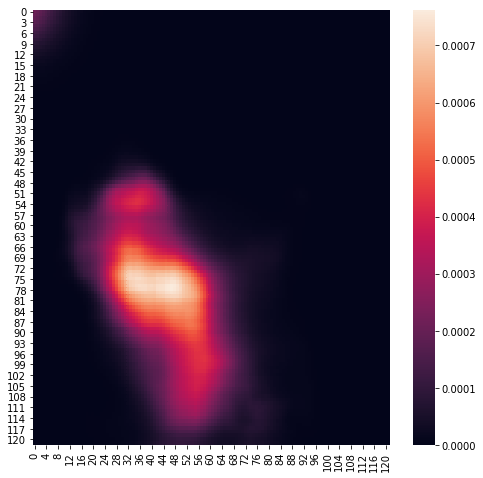

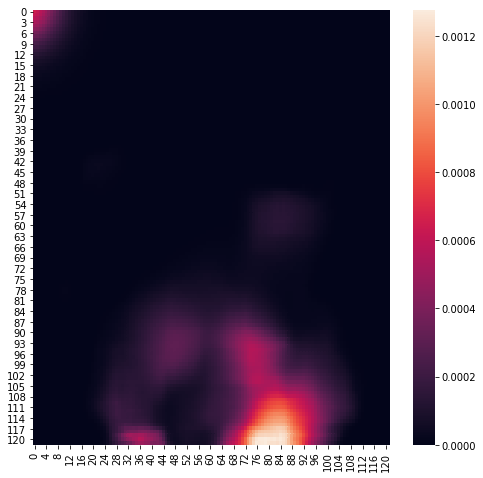

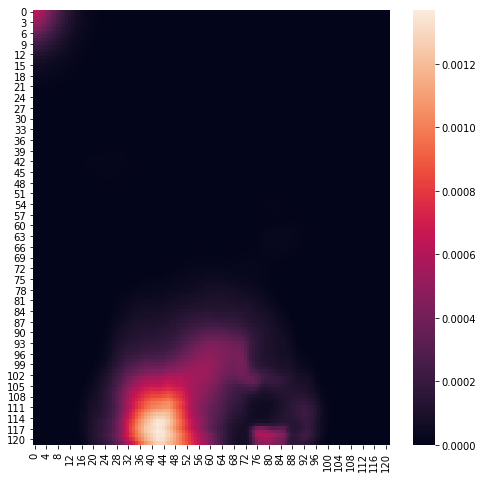

In [345]:
hm  = heatmaps.sum(axis=0)/heatmaps.shape[0]
for i in range(hm.shape[0]):
    fig=plt.figure(figsize=(8,8))
    sns.heatmap(hm[i].cpu().numpy())
    #plt.imshow(hm[i].cpu().numpy())

In [322]:
for k in range(hm.shape[0]):
    hm[k] = hm[k]/hm[k].sum(0).expand_as(hm[k]) 
    hm[k][torch.isnan(hm[k])]=0

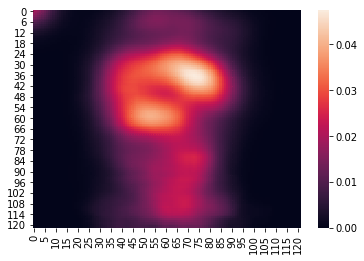

In [330]:
sns.heatmap(hm.sum(axis=0).cpu().numpy())

In [323]:
hm.shapea

torch.Size([13, 122, 122])

In [312]:
hm = hm/hm.sum(0)#.expand_as(hm) 
hm[torch.isnan(hm)]=0

In [314]:
hm.shape

torch.Size([13, 122, 122])

In [249]:
from modules.alex_hourglass import  make_coordinate_grid

In [294]:
def make_coordinate_grid_local(spatial_size, type):
    """
    Create a meshgrid [-1,1] x [-1,1] of given spatial_size.
    """
    h, w = spatial_size
    x = torch.arange(w).type(type)
    y = torch.arange(h).type(type)

    x = (2 * (x / (w - 1)) - 1)
    y = (2 * (y / (h - 1)) - 1)

    yy = y.view(-1, 1).repeat(1, w)
    xx = x.view(1, -1).repeat(h, 1)

    meshed = torch.cat([xx.unsqueeze_(2), yy.unsqueeze_(2)], 2)
    print(meshed.shape)
    return meshed

In [291]:
def gaussian2kp_local(heatmap):
    """
    Extract the mean and the variance from a heatmap
    """
    shape = heatmap.shape
    heatmap = heatmap.unsqueeze(-1)
    grid = make_coordinate_grid_local(shape[2:], heatmap.type()).unsqueeze_(0).unsqueeze_(0).to(heatmap.device)
    value = (heatmap * grid).sum(dim=(2, 3))
    kp = {'value': value}

    return kp

In [295]:
kp = gaussian2kp_local( heatmaps[0].unsqueeze(0))["value"]

torch.Size([122, 122, 2])


In [346]:
kp = gaussian2kp_local(hm.unsqueeze(0))["value"]

torch.Size([122, 122, 2])


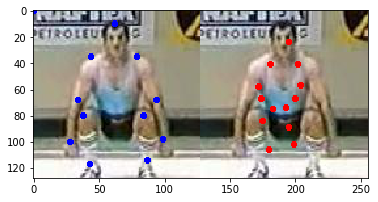

In [347]:
kps = kp[0]
img = np.concatenate((draw_kp(tensor_to_image(batch['imgs'][k]),unnorm_kp(batch['annots'][k])),
                                            draw_kp(tensor_to_image(batch['imgs'][k]), unnorm_kp(kps), color='red')), axis=2)
plt.imshow(np.rollaxis(img, 0, 3))

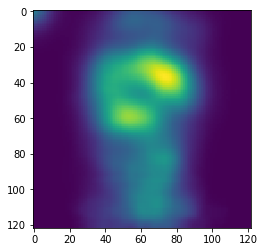

In [266]:
plt.imshow(heatmaps.sum(axis=0).sum(axis=0).cpu().numpy())

In [ ]:
heatmaps.sum(axis=0).sum(axis=0)

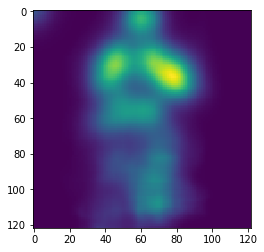

In [267]:
plt.imshow(heatmaps[0].sum(axis=0).cpu().numpy())

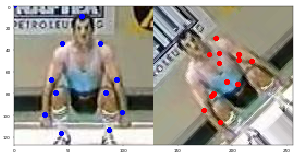

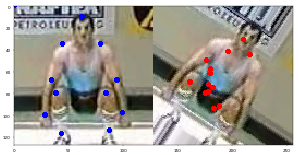

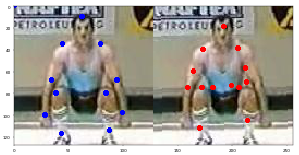

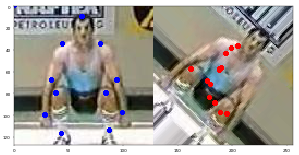

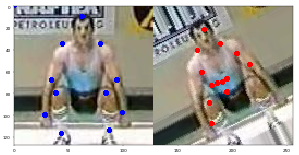

...

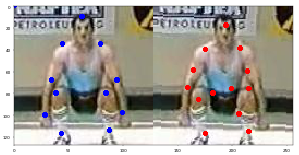

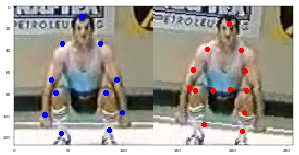

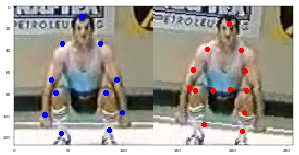

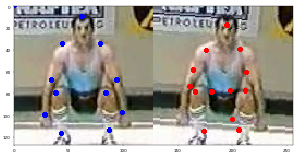

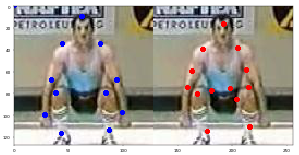

In [344]:
for concat_img in concat_imgs:
    fig=plt.figure(figsize=(12,8), dpi= 30)
    plt.imshow(np.rollaxis(concat_img, 0, 3))

# Kp plot

section for kp plot

In [9]:
def plot_kp(path, n_img=20):
    path
    imgs = pickle.load(open(path, 'rb'))
    i = 0
    for data in imgs:
        data = np.rollaxis(data, 0, 3)
        #data = np.reshape(data, (128,256,3))
        fig=plt.figure(figsize=(12,8), dpi= 30)
        d = data#np.sum(data, axis=2)
        plt.imshow(d)
        i+=1
        if i >n_img:
            break

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


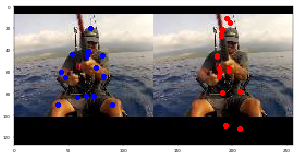

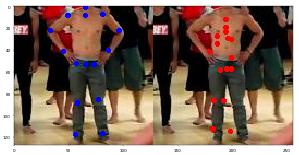

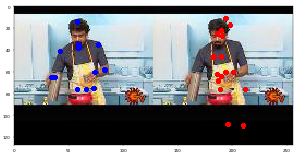

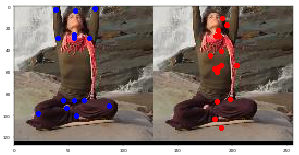

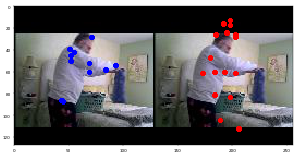

...

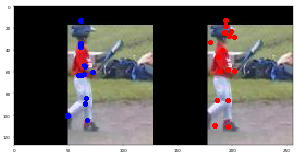

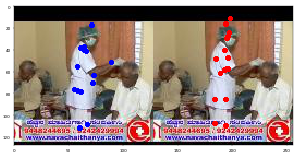

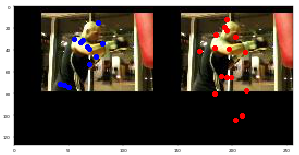

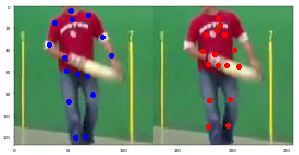

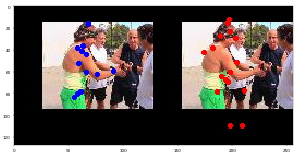

In [10]:
plot_kp('/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 16:52:02/img.pkl' )

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


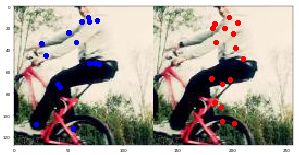

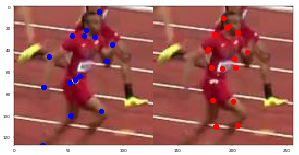

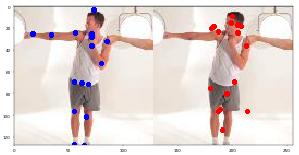

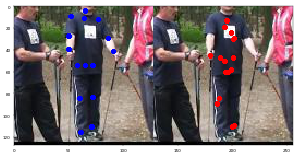

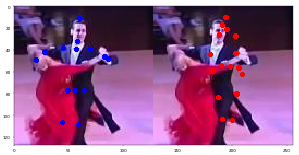

...

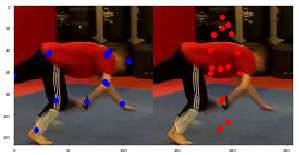

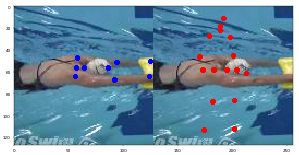

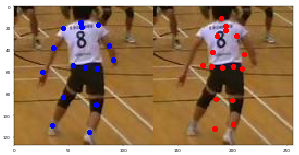

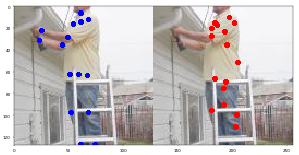

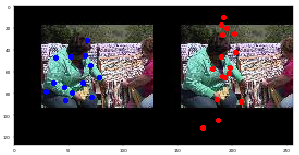

In [10]:
plot_kp('/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 17-11-20 20:05:29/img.pkl')

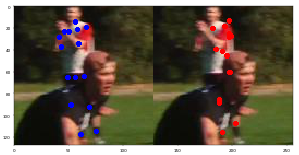

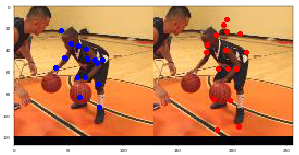

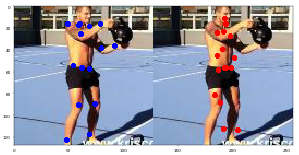

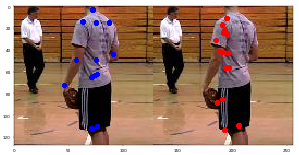

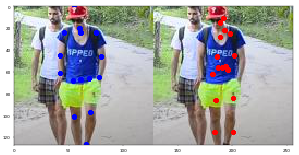

...

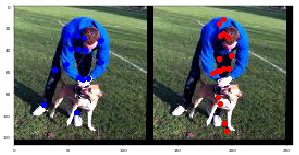

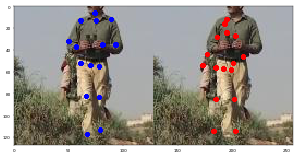

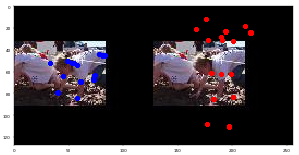

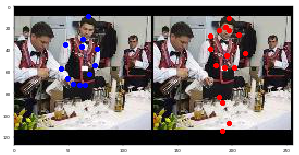

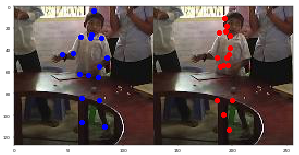

In [11]:
plot_kp('/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 07:40:28/img.pkl')

In [26]:
min(45, 20)

20

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


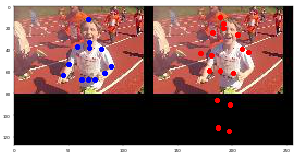

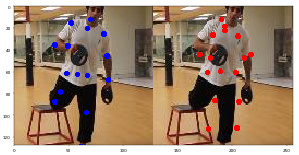

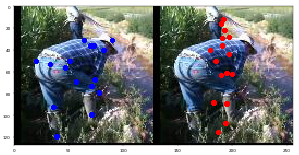

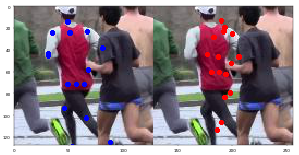

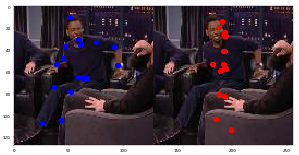

...

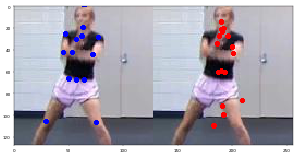

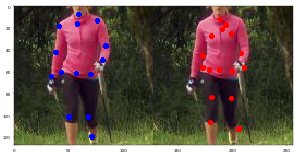

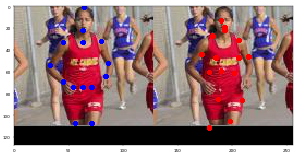

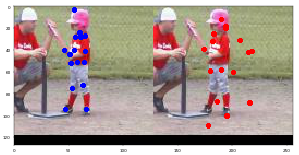

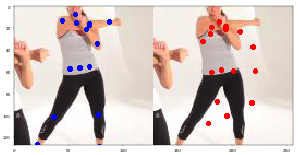

In [41]:
plot_kp('/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 18-11-20 09:11:10/img.pkl')

/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


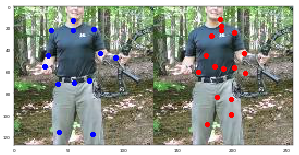

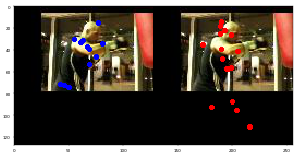

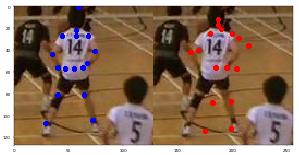

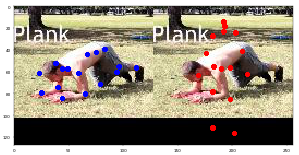

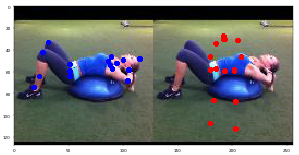

...

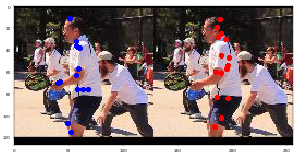

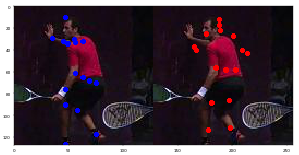

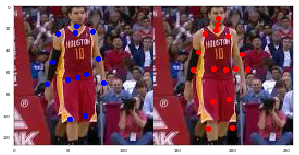

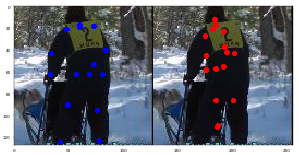

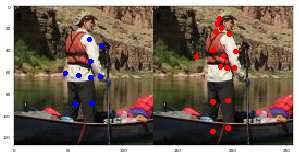

In [81]:
plot_kp('/home/rfranceschini/usc2dk/models/h36m_mpii/u2dkp 19-11-20 08:30:21/img.pkl')


/home/rfranceschini/anaconda3/envs/pose_est/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


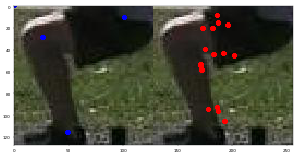

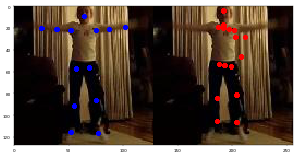

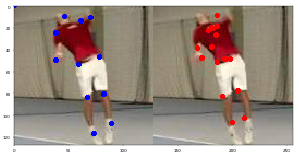

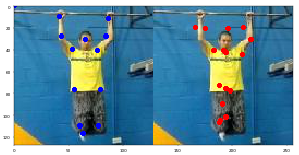

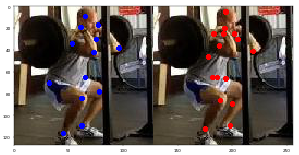

...

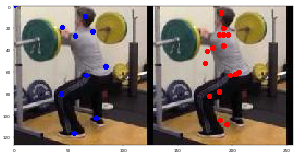

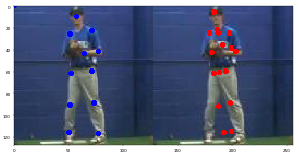

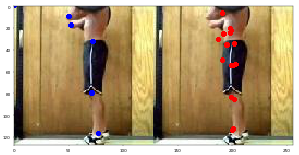

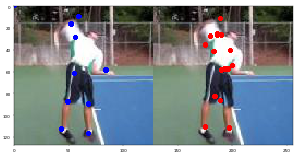

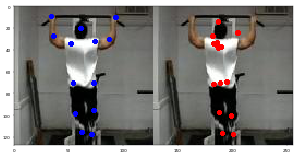

In [56]:
plot_kp('/home/rfranceschini/usc2dk/source_model/mpii/source_levi/img.pkl')